# Importing The Libraries

In [1]:
import numpy as np
import cv2
import pandas as pd

In [2]:
from matplotlib import pyplot as plt
import os

In [3]:
from skimage.filters import roberts, sobel, scharr, prewitt
from scipy import ndimage as nd

In [4]:
import gif2numpy


# Extract Features from Images

In [5]:
# Next time change th path format
train_path = "D:\\Data sets\\DRIVE\\training"
train_ids = next(os.walk(train_path + "\\images"))[2]
gt_ids = next(os.walk(train_path + "\\1st_manual"))[2]

In [6]:
gt_ids

['21_manual1.gif',
 '22_manual1.gif',
 '23_manual1.gif',
 '24_manual1.gif',
 '25_manual1.gif',
 '26_manual1.gif',
 '27_manual1.gif',
 '28_manual1.gif',
 '29_manual1.gif',
 '30_manual1.gif',
 '31_manual1.gif',
 '32_manual1.gif',
 '33_manual1.gif',
 '34_manual1.gif',
 '35_manual1.gif',
 '36_manual1.gif',
 '37_manual1.gif',
 '38_manual1.gif',
 '39_manual1.gif',
 '40_manual1.gif']

In [7]:
train_ids

['21_training.tif',
 '22_training.tif',
 '23_training.tif',
 '24_training.tif',
 '25_training.tif',
 '26_training.tif',
 '27_training.tif',
 '28_training.tif',
 '29_training.tif',
 '30_training.tif',
 '31_training.tif',
 '32_training.tif',
 '33_training.tif',
 '34_training.tif',
 '35_training.tif',
 '36_training.tif',
 '37_training.tif',
 '38_training.tif',
 '39_training.tif',
 '40_training.tif']

In [8]:
def originalImg(img,df):
    img2 = img.reshape(-1)
    df['Original_Image'] = img2
    return df,img2

In [9]:
def gaborFilter(img2,df):
    #Generate Gabor features
    num = 1  
    kernels = []
    for theta in range(2):   
        theta = theta / 4. * np.pi
        for sigma in (1, 3): 
            for lamda in np.arange(0, np.pi, np.pi / 4):   
                for gamma in (0.05, 0.5):


                    gabor_label = 'Gabor' + str(num)
                    # print(gabor_label)
                    ksize=5
                    kernel = cv2.getGaborKernel((ksize, ksize), sigma, theta, lamda, gamma, 0, ktype=cv2.CV_32F)    
                    kernels.append(kernel)
                    
                    fimg = cv2.filter2D(img2, cv2.CV_8UC3, kernel)
                    filtered_img = fimg.reshape(-1)
                    df[gabor_label] = filtered_img 
                    
                    num += 1  #Increment for gabor column label
    return df

In [10]:
def cannyEdge(df,img):
    #CANNY EDGE
    edges = cv2.Canny(img, 10,200)   #Image, min and max values
    edges1 = edges.reshape(-1)
    df['Canny_Edge'] = edges1 #Add column to original dataframe
    return df

In [11]:
def the4edgeDetectors(df,img):
    edge_roberts = roberts(img)
    edge_roberts1 = edge_roberts.reshape(-1)
    df['Roberts'] = edge_roberts1
    
    #SOBEL
    edge_sobel = sobel(img)
    edge_sobel1 = edge_sobel.reshape(-1)
    df['Sobel'] = edge_sobel1
    
    #SCHARR
    edge_scharr = scharr(img)
    edge_scharr1 = edge_scharr.reshape(-1)
    df['Scharr'] = edge_scharr1
    
    #PREWITT
    edge_prewitt = prewitt(img)
    edge_prewitt1 = edge_prewitt.reshape(-1)
    df['Prewitt'] = edge_prewitt1
    
    return df

In [40]:
def gmv(df,img):
    #GAUSSIAN with sigma=3

    gaussian_img = nd.gaussian_filter(img, sigma=3)
    gaussian_img1 = gaussian_img.reshape(-1)
    df['Gaussian s3'] = gaussian_img1

    #GAUSSIAN with sigma=7
    gaussian_img2 = nd.gaussian_filter(img, sigma=7)
    gaussian_img3 = gaussian_img2.reshape(-1)
    df['Gaussian s7'] = gaussian_img3

    #MEDIAN with sigma=3
    median_img = nd.median_filter(img, size=3)
    median_img1 = median_img.reshape(-1)
    df['Median s3'] = median_img1

    #VARIANCE with size=3
    variance_img = nd.generic_filter(img, np.var, size=3)
    variance_img1 = variance_img.reshape(-1)
    df['Variance s3'] = variance_img1  #Add column to original dataframe
    
     #VARIANCE with size=5
    variance_img = nd.generic_filter(img, np.var, size=5)
    variance_img1 = variance_img.reshape(-1)
    df['Variance s5'] = variance_img1  #Add column to original dataframe
    return df

In [13]:
def gtImage(gt_path,df):
    frames, exts, image_specs = gif2numpy.convert(gt_path)
    frames = np.array(frames)
    labeled_img = frames.reshape(584, 565,3)
    labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_BGR2GRAY)
    thresh = 0
    labeled_img = labeled_img > 0
    labeled_img1 = labeled_img.reshape(-1)
    df['Labels'] = labeled_img1
    return df

In [41]:
image_dataset = pd.DataFrame()

In [42]:
for _id in range(20):
    if _id in (17, 12, 0, 5, 10):
        print(_id)
        continue
    print('*',_id)
    image = train_ids[_id]
    gt_image = gt_ids[_id]
    
    df = pd.DataFrame()  #Temporary data frame for each Image
    
    path = train_path + "\\images\\" + image
    print(path)
    
    img = cv2.imread(path)
    img = img[:,:,1]
    df,img2 = originalImg(img,df)
    df['Image_Name'] = image
    df = gaborFilter(img2,df)
    
    df = cannyEdge(df,img)
    
    df = the4edgeDetectors(df,img)
    
    df = gmv(df,img)
    
    gt_path = train_path + "\\1st_manual\\" + gt_image
    print(gt_path)
    df = gtImage(gt_path,df)
    
    image_dataset = pd.concat([image_dataset,df])
    print(image_dataset.shape)

0
* 1
D:\Data sets\DRIVE\training\images\22_training.tif
D:\Data sets\DRIVE\training\1st_manual\22_manual1.gif
(329960, 45)
* 2
D:\Data sets\DRIVE\training\images\23_training.tif
D:\Data sets\DRIVE\training\1st_manual\23_manual1.gif
(659920, 45)
* 3
D:\Data sets\DRIVE\training\images\24_training.tif
D:\Data sets\DRIVE\training\1st_manual\24_manual1.gif
(989880, 45)
* 4
D:\Data sets\DRIVE\training\images\25_training.tif
D:\Data sets\DRIVE\training\1st_manual\25_manual1.gif
(1319840, 45)
5
* 6
D:\Data sets\DRIVE\training\images\27_training.tif
D:\Data sets\DRIVE\training\1st_manual\27_manual1.gif
(1649800, 45)
* 7
D:\Data sets\DRIVE\training\images\28_training.tif
D:\Data sets\DRIVE\training\1st_manual\28_manual1.gif
(1979760, 45)
* 8
D:\Data sets\DRIVE\training\images\29_training.tif
D:\Data sets\DRIVE\training\1st_manual\29_manual1.gif
(2309720, 45)
* 9
D:\Data sets\DRIVE\training\images\30_training.tif
D:\Data sets\DRIVE\training\1st_manual\30_manual1.gif
(2639680, 45)
10
* 11
D:\Data

In [43]:
image_dataset.head()

,Original_Image,Image_Name,Gabor1,Gabor2,Gabor3,Gabor4,Gabor5,Gabor6,Gabor7,Gabor8,...,Roberts,Sobel,Scharr,Prewitt,Gaussian s3,Gaussian s7,Median s3,Variance s3,Variance s5,Labels
0,0,22_training.tif,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,1,0,0,0,False
1,0,22_training.tif,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,1,0,0,0,False
2,0,22_training.tif,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,1,0,0,0,False
3,0,22_training.tif,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,1,0,0,0,False
4,0,22_training.tif,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,1,0,0,0,False


# Train and Test

In [44]:
x = image_dataset.drop(labels = ["Image_Name","Labels"], axis=1)
x[:10]

,Original_Image,Gabor1,Gabor2,Gabor3,Gabor4,Gabor5,Gabor6,Gabor7,Gabor8,Gabor9,...,Canny_Edge,Roberts,Sobel,Scharr,Prewitt,Gaussian s3,Gaussian s7,Median s3,Variance s3,Variance s5
0,0,0,0,0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,0,1,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,0,1,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,0,1,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,0,1,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,0,1,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,0,1,0,0,0


In [45]:
y = image_dataset["Labels"]
y[:10]

0    False
1    False
2    False
3    False
4    False
5    False
6    False
7    False
8    False
9    False
Name: Labels, dtype: bool

In [46]:
from sklearn.model_selection import train_test_split

In [47]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=20)

In [48]:
X_train.shape, X_test.shape

((3712050, 43), (1237350, 43))

# XGBoost Model

In [22]:
import xgboost as xgb

In [23]:
xg_cl = xgb.XGBClassifier(objective='binary:logistic', learning_rate = 0.1, max_depth = 5, min_child_weight = 5, subsample = 0.7, colsample_bytree = 0.7, 
                          n_estimators=200, seed=99)

In [49]:
eval_set = [(X_train, y_train), (X_test, y_test)]

In [50]:
xg_cl.fit(X_train, y_train, eval_metric=["error"], eval_set=eval_set, verbose=True)
results = xg_cl.evals_result()

C:\Users\Shirsendu\AppData\Local\Programs\Python\Python38\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-error:0.07413	validation_1-error:0.07443
[1]	validation_0-error:0.06399	validation_1-error:0.06405
[2]	validation_0-error:0.06337	validation_1-error:0.06350
[3]	validation_0-error:0.05933	validation_1-error:0.05936
[4]	validation_0-error:0.06191	validation_1-error:0.06215
[5]	validation_0-error:0.05925	validation_1-error:0.05953
[6]	validation_0-error:0.05799	validation_1-error:0.05808
[7]	validation_0-error:0.05791	validation_1-error:0.05799
[8]	validation_0-error:0.05658	validation_1-error:0.05665
[9]	validation_0-error:0.05638	validation_1-error:0.05653
[10]	validation_0-error:0.05633	validation_1-error:0.05647
[11]	validation_0-error:0.05549	validation_1-error:0.05566
[12]	validation_0-error:0.05552	validation_1-error:0.05573
[13]	validation_0-error:0.05515	validation_1-error:0.05533
[14]	validation_0-error:0.05498	validation_1-error:0.05525
[15]	validation_0-error:0.05479	validation_1-error:0.05506
[16]	validation_0-error:0.05454	validation_1-error:0.05481
[17]	va

[139]	validation_0-error:0.04428	validation_1-error:0.04447
[140]	validation_0-error:0.04425	validation_1-error:0.04444
[141]	validation_0-error:0.04422	validation_1-error:0.04443
[142]	validation_0-error:0.04421	validation_1-error:0.04442
[143]	validation_0-error:0.04419	validation_1-error:0.04439
[144]	validation_0-error:0.04418	validation_1-error:0.04437
[145]	validation_0-error:0.04416	validation_1-error:0.04437
[146]	validation_0-error:0.04414	validation_1-error:0.04434
[147]	validation_0-error:0.04413	validation_1-error:0.04432
[148]	validation_0-error:0.04412	validation_1-error:0.04431
[149]	validation_0-error:0.04410	validation_1-error:0.04429
[150]	validation_0-error:0.04409	validation_1-error:0.04428
[151]	validation_0-error:0.04406	validation_1-error:0.04428
[152]	validation_0-error:0.04405	validation_1-error:0.04425
[153]	validation_0-error:0.04405	validation_1-error:0.04425
[154]	validation_0-error:0.04403	validation_1-error:0.04422
[155]	validation_0-error:0.04402	validat

In [51]:
import pickle

In [52]:
filename = "xgboostTop15Raw"
pickle.dump(xg_cl,open(filename, 'wb'))


In [53]:
xg_cl = pickle.load(open(filename, 'rb'))

In [54]:
predictions = xg_cl.predict(X_test)

In [55]:
# Compute the accuracy: accuracy
accuracy = float(np.sum(predictions == y_test))/y_test.shape[0]
print("accuracy: %f" % (accuracy*100))

accuracy: 95.617247


In [56]:
from sklearn import metrics

In [57]:
from sklearn.metrics import confusion_matrix, f1_score

In [58]:
from sklearn.metrics import classification_report

In [59]:
predict_y = xg_cl.predict(X_test)

print ("Accuracy on the Original Image = ", metrics.accuracy_score(y_test, predict_y))
print ("F1 Score on the Original Image = ", f1_score(y_test, predict_y, average='weighted'))

Accuracy on the Original Image =  0.9561724653493353
F1 Score on the Original Image =  0.9537102050006098


In [60]:
cm = confusion_matrix(y_test, predict_y)
cm

array([[1111650,   14988],
       [  39242,   71470]], dtype=int64)

In [61]:
print(classification_report(y_test, predict_y))

              precision    recall  f1-score   support

       False       0.97      0.99      0.98   1126638
        True       0.83      0.65      0.72    110712

    accuracy                           0.96   1237350
   macro avg       0.90      0.82      0.85   1237350
weighted avg       0.95      0.96      0.95   1237350



In [62]:
tn, fp, fn, tp = cm.ravel()

In [63]:
tn, fp, fn, tp

(1111650, 14988, 39242, 71470)

In [64]:
def getMetrics(cm):
    tn, fp, fn, tp = cm.ravel()
    sen = tp/(tp+fn)
    spe = tn/(tn+fp) 
    acc = (tp + tn)/(tp + tn + fp +fn)
    return sen, spe , acc

In [65]:
Sensitivity, Specificity, Accuracy = getMetrics(cm)
Sensitivity, Specificity, Accuracy 

(0.6455488113302984, 0.9866967029338616, 0.9561724653493353)

# Importance

In [66]:
xg_cl.feature_importances_

array([0.08650871, 0.        , 0.        , 0.00931536, 0.03713999,
       0.00374995, 0.04061553, 0.04576457, 0.02664785, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.00331487, 0.00733745, 0.        , 0.        , 0.00047899,
       0.00981287, 0.0030649 , 0.00788454, 0.00244881, 0.01574447,
       0.        , 0.        , 0.00375346, 0.00705178, 0.00216062,
       0.00875042, 0.00312473, 0.00366569, 0.00920583, 0.00901946,
       0.0402719 , 0.02264483, 0.01529518, 0.02392466, 0.06006166,
       0.05060349, 0.07089204, 0.3697454 ], dtype=float32)

<BarContainer object of 43 artists>

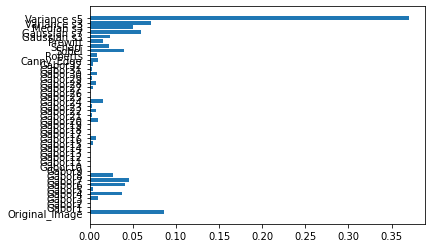

In [67]:
plt.barh(X_train.columns, xg_cl.feature_importances_)

In [68]:
sorted_idx = xg_cl.feature_importances_.argsort()[::-1]

In [69]:
xg_cl.feature_importances_[sorted_idx]

array([0.3697454 , 0.08650871, 0.07089204, 0.06006166, 0.05060349,
       0.04576457, 0.04061553, 0.0402719 , 0.03713999, 0.02664785,
       0.02392466, 0.02264483, 0.01574447, 0.01529518, 0.00981287,
       0.00931536, 0.00920583, 0.00901946, 0.00875042, 0.00788454,
       0.00733745, 0.00705178, 0.00375346, 0.00374995, 0.00366569,
       0.00331487, 0.00312473, 0.0030649 , 0.00244881, 0.00216062,
       0.00047899, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        ], dtype=float32)

In [75]:
xg_cl.feature_importances_[sorted_idx][:19]

array([0.3697454 , 0.08650871, 0.07089204, 0.06006166, 0.05060349,
       0.04576457, 0.04061553, 0.0402719 , 0.03713999, 0.02664785,
       0.02392466, 0.02264483, 0.01574447, 0.01529518, 0.00981287,
       0.00931536, 0.00920583, 0.00901946, 0.00875042], dtype=float32)

In [74]:
sum([0.3697454 , 0.08650871, 0.07089204, 0.06006166, 0.05060349,
       0.04576457, 0.04061553, 0.0402719 , 0.03713999, 0.02664785,
       0.02392466, 0.02264483, 0.01574447, 0.01529518, 0.00981287,
       0.00931536, 0.00920583, 0.00901946, 0.00875042])

0.9432137999999999

In [76]:
X_train.columns[sorted_idx]

Index(['Variance s5', 'Original_Image', 'Variance s3', 'Gaussian s7',
       'Median s3', 'Gabor7', 'Gabor6', 'Sobel', 'Gabor4', 'Gabor8',
       'Gaussian s3', 'Scharr', 'Gabor24', 'Prewitt', 'Gabor20', 'Gabor3',
       'Canny_Edge', 'Roberts', 'Gabor30', 'Gabor22', 'Gabor16', 'Gabor28',
       'Gabor27', 'Gabor5', 'Gabor32', 'Gabor15', 'Gabor31', 'Gabor21',
       'Gabor23', 'Gabor29', 'Gabor19', 'Gabor14', 'Gabor26', 'Gabor12',
       'Gabor11', 'Gabor10', 'Gabor9', 'Gabor17', 'Gabor18', 'Gabor25',
       'Gabor2', 'Gabor1', 'Gabor13'],
      dtype='object')

In [77]:
top_10idx = sorted_idx[:10]
top_idx = sorted_idx[:19]

Text(0.5, 0, 'Xgboost Feature Importance')

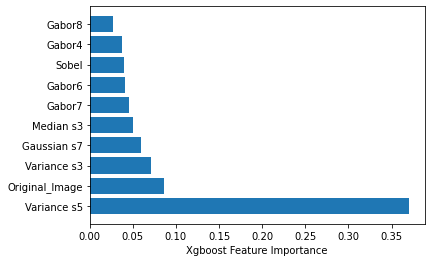

In [78]:
plt.barh(X_train.columns[top_10idx], xg_cl.feature_importances_[top_10idx])
plt.xlabel("Xgboost Feature Importance")

Text(0.5, 0, 'Xgboost Feature Importance')

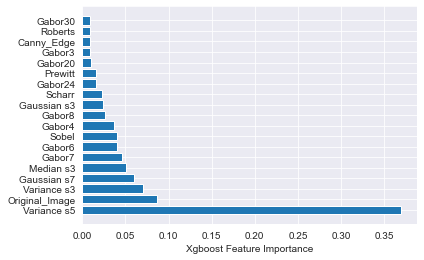

In [112]:
plt.barh(X_train.columns[top_idx], xg_cl.feature_importances_[top_idx])
plt.xlabel("Xgboost Feature Importance")

In [80]:
from sklearn.feature_selection import SelectFromModel

In [81]:
top_idx

array([42,  0, 41, 39, 40,  7,  6, 35,  4,  8, 38, 36, 24, 37, 20,  3, 33,
       34, 30], dtype=int64)

In [82]:
np.sort(xg_cl.feature_importances_)

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.00047899, 0.00216062, 0.00244881,
       0.0030649 , 0.00312473, 0.00331487, 0.00366569, 0.00374995,
       0.00375346, 0.00705178, 0.00733745, 0.00788454, 0.00875042,
       0.00901946, 0.00920583, 0.00931536, 0.00981287, 0.01529518,
       0.01574447, 0.02264483, 0.02392466, 0.02664785, 0.03713999,
       0.0402719 , 0.04061553, 0.04576457, 0.05060349, 0.06006166,
       0.07089204, 0.08650871, 0.3697454 ], dtype=float32)

# Revised Dataset

In [88]:
selection = SelectFromModel(xg_cl, threshold = 0.008, prefit=True)
select_X_train = selection.transform(X_train)

In [89]:
select_X_test = selection.transform(X_test)

In [90]:
len(select_X_train[0])

19

# Revised Model

In [91]:
xg_cl_sel = xgb.XGBClassifier(objective='binary:logistic', learning_rate = 0.1, max_depth = 5, min_child_weight = 5, subsample = 0.7, colsample_bytree = 0.7, 
                          n_estimators=200, seed=99)

In [92]:
eval_set = [(select_X_train, y_train), (select_X_test, y_test)]

In [93]:
xg_cl_sel.fit(select_X_train, y_train, eval_metric=["error"], eval_set=eval_set, verbose=True)
results = xg_cl_sel.evals_result()

C:\Users\Shirsendu\AppData\Local\Programs\Python\Python38\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-error:0.07662	validation_1-error:0.07695
[1]	validation_0-error:0.07182	validation_1-error:0.07209
[2]	validation_0-error:0.06676	validation_1-error:0.06707
[3]	validation_0-error:0.06608	validation_1-error:0.06643
[4]	validation_0-error:0.06633	validation_1-error:0.06666
[5]	validation_0-error:0.06478	validation_1-error:0.06516
[6]	validation_0-error:0.06408	validation_1-error:0.06448
[7]	validation_0-error:0.06169	validation_1-error:0.06201
[8]	validation_0-error:0.06150	validation_1-error:0.06176
[9]	validation_0-error:0.06060	validation_1-error:0.06089
[10]	validation_0-error:0.06025	validation_1-error:0.06057
[11]	validation_0-error:0.05965	validation_1-error:0.06000
[12]	validation_0-error:0.05851	validation_1-error:0.05890
[13]	validation_0-error:0.05899	validation_1-error:0.05935
[14]	validation_0-error:0.05916	validation_1-error:0.05953
[15]	validation_0-error:0.05883	validation_1-error:0.05921
[16]	validation_0-error:0.05864	validation_1-error:0.05896
[17]	va

[139]	validation_0-error:0.04414	validation_1-error:0.04432
[140]	validation_0-error:0.04413	validation_1-error:0.04431
[141]	validation_0-error:0.04411	validation_1-error:0.04428
[142]	validation_0-error:0.04411	validation_1-error:0.04428
[143]	validation_0-error:0.04409	validation_1-error:0.04426
[144]	validation_0-error:0.04407	validation_1-error:0.04422
[145]	validation_0-error:0.04405	validation_1-error:0.04421
[146]	validation_0-error:0.04404	validation_1-error:0.04421
[147]	validation_0-error:0.04402	validation_1-error:0.04421
[148]	validation_0-error:0.04402	validation_1-error:0.04419
[149]	validation_0-error:0.04401	validation_1-error:0.04419
[150]	validation_0-error:0.04399	validation_1-error:0.04419
[151]	validation_0-error:0.04397	validation_1-error:0.04418
[152]	validation_0-error:0.04396	validation_1-error:0.04417
[153]	validation_0-error:0.04395	validation_1-error:0.04416
[154]	validation_0-error:0.04396	validation_1-error:0.04416
[155]	validation_0-error:0.04394	validat

In [94]:
filename = "xgboostTop15Select"
pickle.dump(xg_cl_sel,open(filename, 'wb'))


In [95]:
predict_y = xg_cl_sel.predict(select_X_test)

print ("Accuracy on the Original Image = ", metrics.accuracy_score(y_test, predict_y))
print ("F1 Score on the Original Image = ", f1_score(y_test, predict_y, average='weighted'))

Accuracy on the Original Image =  0.956227421505637
F1 Score on the Original Image =  0.9538158115660429


In [96]:
def gtImageDis(gt_path):
    frames, exts, image_specs = gif2numpy.convert(gt_path)
    frames = np.array(frames)
    labeled_img = frames.reshape(584, 565,3)
    labeled_img_dis = cv2.cvtColor(labeled_img, cv2.COLOR_BGR2GRAY)
    return labeled_img_dis

# Test All Train Images

In [97]:
f1_set = []
score_set = []

In [98]:
from tqdm import tqdm

  0%|                                                                                                                                                         | 0/20 [00:00<?, ?it/s]

D:\Data sets\DRIVE\training\images\21_training.tif
D:\Data sets\DRIVE\training\1st_manual\21_manual1.gif
Accuracy =  0.9669505394593284
0.9642463682904238


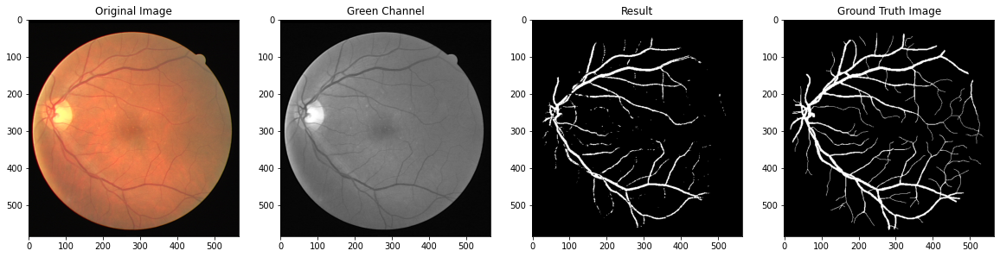

  5%|███████▎                                                                                                                                         | 1/20 [00:13<04:24, 13.90s/it]

D:\Data sets\DRIVE\training\images\22_training.tif
D:\Data sets\DRIVE\training\1st_manual\22_manual1.gif
Accuracy =  0.9620499454479331
0.9593791090594312


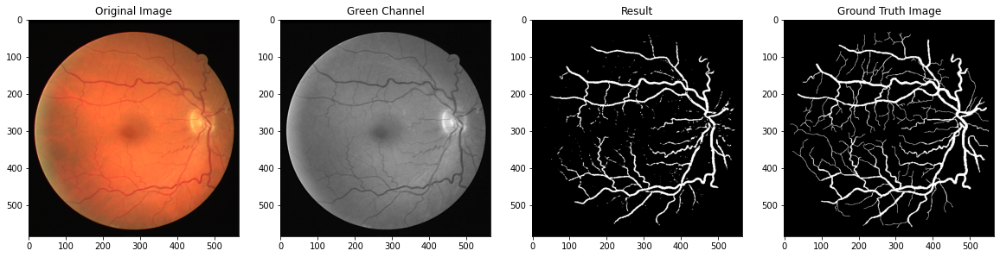

 10%|██████████████▌                                                                                                                                  | 2/20 [00:26<04:04, 13.56s/it]

D:\Data sets\DRIVE\training\images\23_training.tif
D:\Data sets\DRIVE\training\1st_manual\23_manual1.gif
Accuracy =  0.9681688689538126
0.9673126785318567


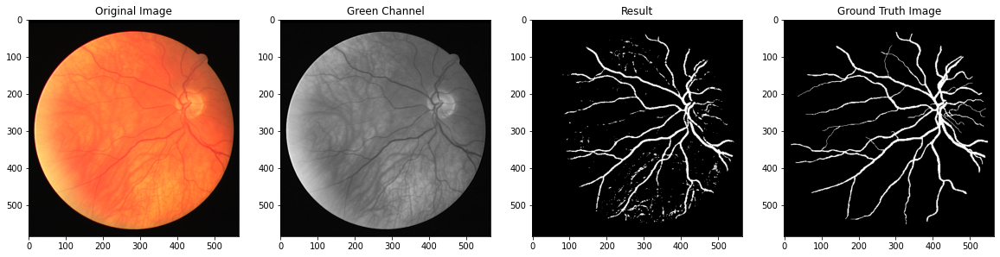

 15%|█████████████████████▊                                                                                                                           | 3/20 [00:45<04:17, 15.13s/it]

D:\Data sets\DRIVE\training\images\24_training.tif
D:\Data sets\DRIVE\training\1st_manual\24_manual1.gif
Accuracy =  0.9500212146926901
0.9452530139753317


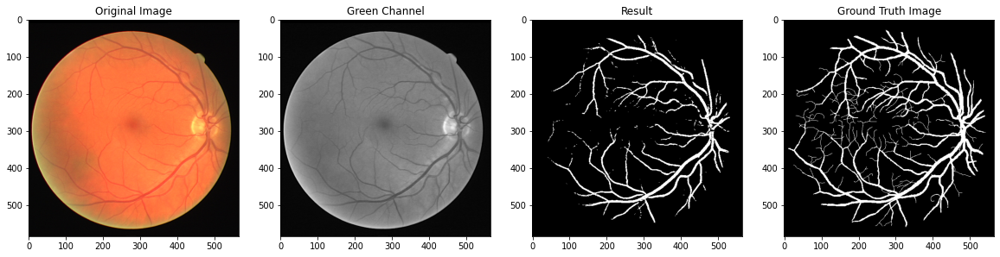

 20%|█████████████████████████████                                                                                                                    | 4/20 [00:57<03:48, 14.25s/it]

D:\Data sets\DRIVE\training\images\25_training.tif
D:\Data sets\DRIVE\training\1st_manual\25_manual1.gif
Accuracy =  0.9428051885076979
0.9343022655391761


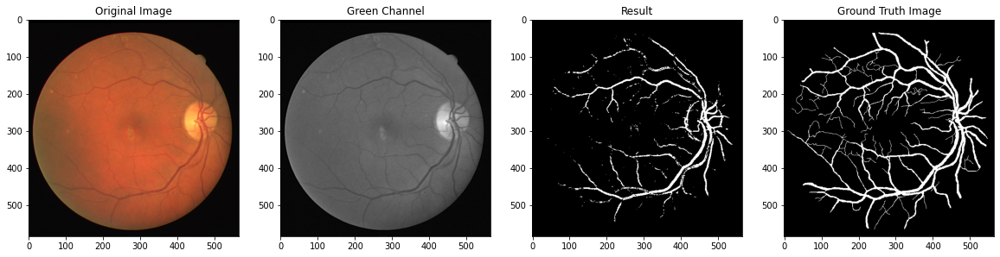

 25%|████████████████████████████████████▎                                                                                                            | 5/20 [01:09<03:24, 13.62s/it]

D:\Data sets\DRIVE\training\images\26_training.tif
D:\Data sets\DRIVE\training\1st_manual\26_manual1.gif
Accuracy =  0.9564189598739241
0.95341866062966


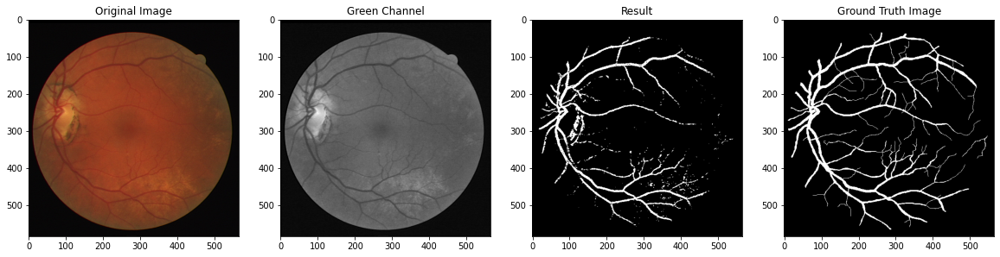

 30%|███████████████████████████████████████████▌                                                                                                     | 6/20 [01:22<03:04, 13.21s/it]

D:\Data sets\DRIVE\training\images\27_training.tif
D:\Data sets\DRIVE\training\1st_manual\27_manual1.gif
Accuracy =  0.9612831858407079
0.9589227018636012


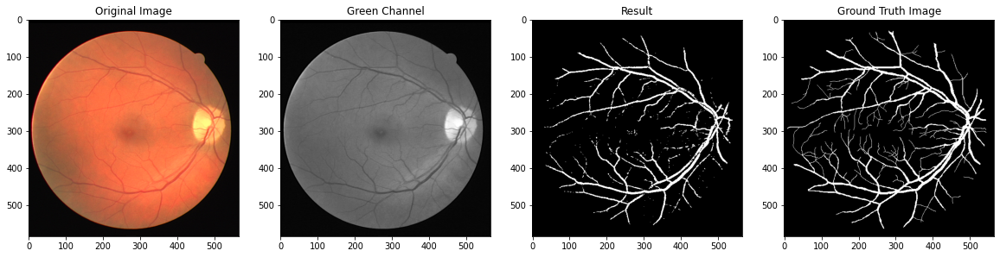

 35%|██████████████████████████████████████████████████▊                                                                                              | 7/20 [01:34<02:47, 12.91s/it]

D:\Data sets\DRIVE\training\images\28_training.tif
D:\Data sets\DRIVE\training\1st_manual\28_manual1.gif
Accuracy =  0.9576251666868711
0.9541675538374371


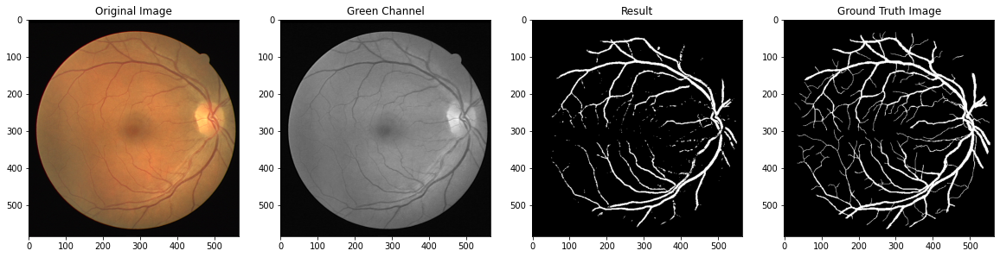

 40%|██████████████████████████████████████████████████████████                                                                                       | 8/20 [01:46<02:33, 12.80s/it]

D:\Data sets\DRIVE\training\images\29_training.tif
D:\Data sets\DRIVE\training\1st_manual\29_manual1.gif
Accuracy =  0.9618196144987271
0.9599755882935184


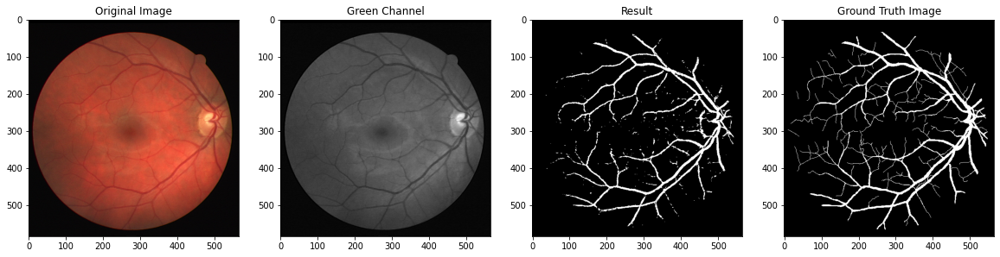

 45%|█████████████████████████████████████████████████████████████████▎                                                                               | 9/20 [01:59<02:19, 12.67s/it]

D:\Data sets\DRIVE\training\images\30_training.tif
D:\Data sets\DRIVE\training\1st_manual\30_manual1.gif
Accuracy =  0.9588010667959753
0.9555045975107161


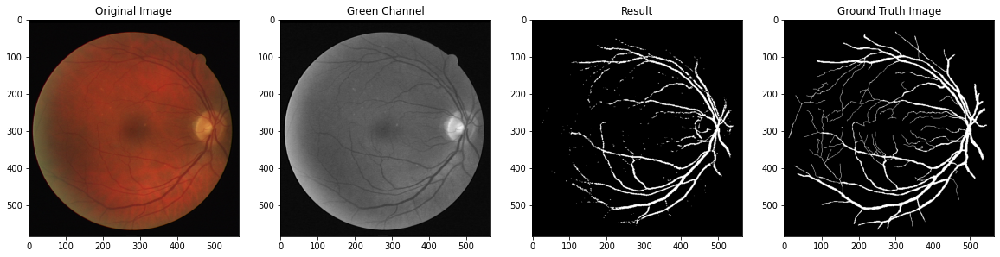

 50%|████████████████████████████████████████████████████████████████████████                                                                        | 10/20 [02:11<02:05, 12.60s/it]

D:\Data sets\DRIVE\training\images\31_training.tif
D:\Data sets\DRIVE\training\1st_manual\31_manual1.gif
Accuracy =  0.9685173960480058
0.9677861103051882


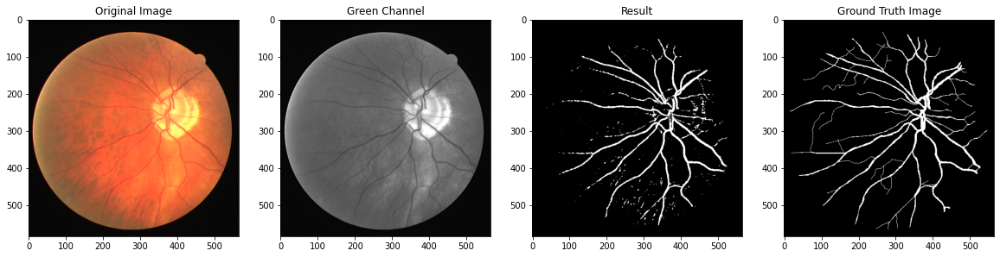

 55%|███████████████████████████████████████████████████████████████████████████████▏                                                                | 11/20 [02:23<01:52, 12.52s/it]

D:\Data sets\DRIVE\training\images\32_training.tif
D:\Data sets\DRIVE\training\1st_manual\32_manual1.gif
Accuracy =  0.9623984725421263
0.9589122134435689


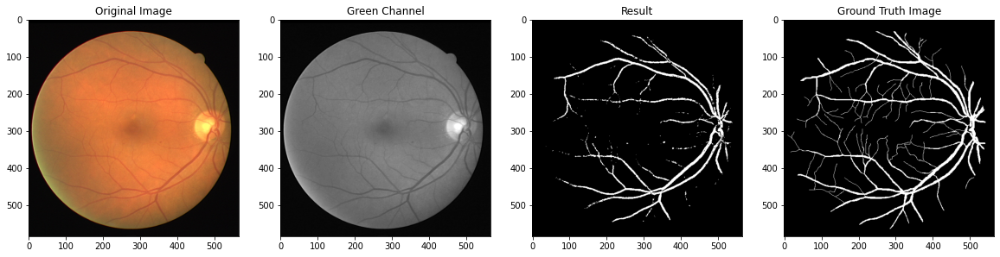

 60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                         | 12/20 [02:36<01:39, 12.42s/it]

D:\Data sets\DRIVE\training\images\33_training.tif
D:\Data sets\DRIVE\training\1st_manual\33_manual1.gif
Accuracy =  0.9625227300278821
0.9591731061000871


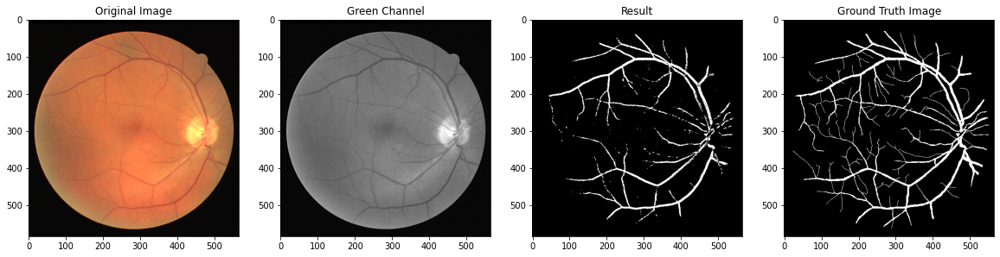

 65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 13/20 [02:48<01:26, 12.34s/it]

D:\Data sets\DRIVE\training\images\34_training.tif
D:\Data sets\DRIVE\training\1st_manual\34_manual1.gif
Accuracy =  0.9179809673899867
0.9209290246689883


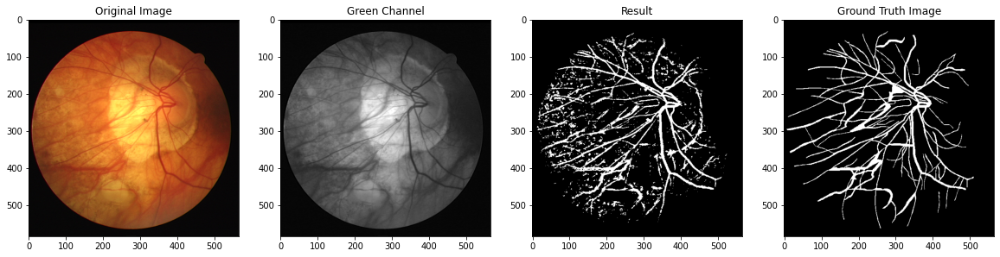

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 14/20 [03:00<01:13, 12.29s/it]

D:\Data sets\DRIVE\training\images\35_training.tif
D:\Data sets\DRIVE\training\1st_manual\35_manual1.gif
Accuracy =  0.9658443447690629
0.9649119173690098


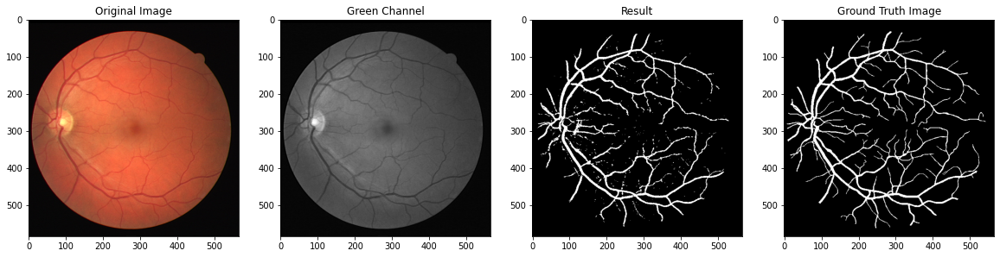

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 15/20 [03:12<01:01, 12.27s/it]

D:\Data sets\DRIVE\training\images\36_training.tif
D:\Data sets\DRIVE\training\1st_manual\36_manual1.gif
Accuracy =  0.952842768820463
0.9496654965872106


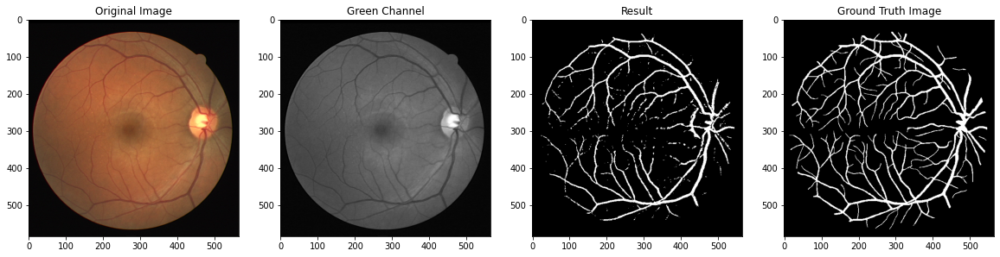

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 16/20 [03:24<00:48, 12.24s/it]

D:\Data sets\DRIVE\training\images\37_training.tif
D:\Data sets\DRIVE\training\1st_manual\37_manual1.gif
Accuracy =  0.9609316280761304
0.9602044118595311


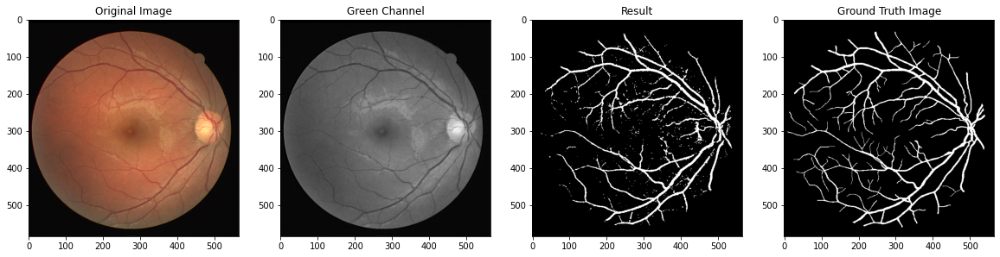

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 17/20 [03:37<00:36, 12.22s/it]

D:\Data sets\DRIVE\training\images\38_training.tif
D:\Data sets\DRIVE\training\1st_manual\38_manual1.gif
Accuracy =  0.9476633531337132
0.9399223067514266


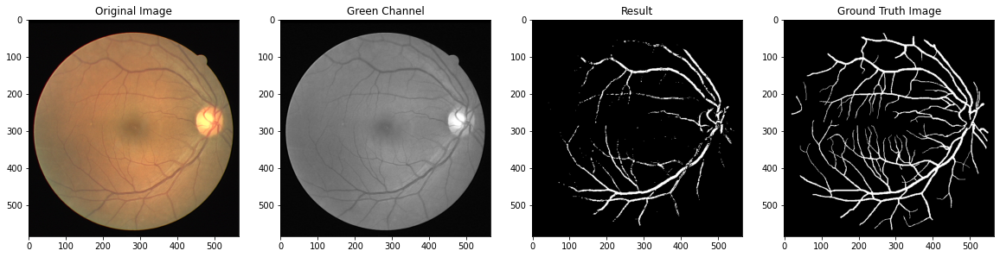

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 18/20 [03:49<00:24, 12.23s/it]

D:\Data sets\DRIVE\training\images\39_training.tif
D:\Data sets\DRIVE\training\1st_manual\39_manual1.gif
Accuracy =  0.9583616195902533
0.9564590277122201


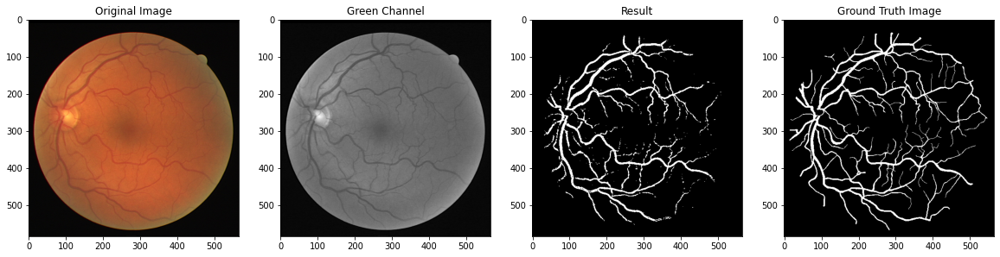

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 19/20 [04:01<00:12, 12.29s/it]

D:\Data sets\DRIVE\training\images\40_training.tif
D:\Data sets\DRIVE\training\1st_manual\40_manual1.gif
Accuracy =  0.965038186446842
0.9641679714606796


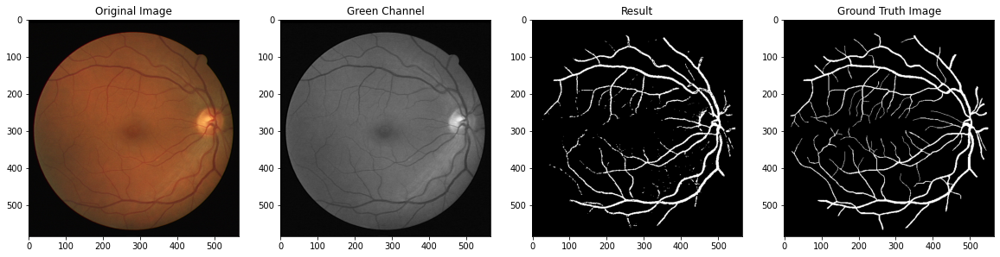

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:13<00:00, 12.70s/it]


In [99]:
for _id in tqdm(range(len(train_ids))):
    
    image = train_ids[_id]
    gt_image = gt_ids[_id]
    

    tdf = pd.DataFrame()  #Temporary data frame for each Image

    path = train_path + "\\images\\" + image
    print(path)

    img = cv2.imread(path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img[:,:,1]

#     plt.imshow(img ,cmap = "gray")

    tdf,img2 = originalImg(img,tdf)
    tdf['Image_Name'] = image
    tdf = gaborFilter(img2,tdf)

    tdf = cannyEdge(tdf,img)

    tdf = the4edgeDetectors(tdf,img)

    tdf = gmv(tdf,img)

    gt_path = train_path + "\\1st_manual\\" + gt_image
    print(gt_path)
    tdf = gtImage(gt_path,tdf)
    
    x = tdf.drop(labels = ["Image_Name","Labels"], axis=1)
    select_X_train = selection.transform(x)
    y = tdf["Labels"]
    
    
    
    prediction_test = xg_cl_sel.predict(select_X_train)
    result = prediction_test.reshape((584, 565))
    
    
    gtImg = gtImageDis(gt_path)


    
    fig, axes = plt.subplots(1, 4, figsize=(20, 20))
    ax = axes.ravel()
    ax[0].set_title("Original Image")
    ax[0].imshow(img_rgb, cmap = 'gray')
    ax[1].set_title("Green Channel")
    ax[1].imshow(img, cmap = 'gray')
    ax[2].set_title("Result")
    ax[2].imshow(result, cmap = 'gray')
    ax[3].set_title("Ground Truth Image")
    ax[3].imshow(gtImg, cmap = 'gray')
    
    acc = metrics.accuracy_score(y, prediction_test)
    print ("Accuracy = ", acc)
    
    cm = confusion_matrix(y, prediction_test)
    sens, spe, acc = getMetrics(cm)
    
    print(f1_score(y, prediction_test, average = "weighted"))
    f1_set.append([train_ids[_id],f1_score(y, prediction_test, average = "weighted")])
    score_set.append([train_ids[_id], sens, spe, acc])
    
    filename = "processed//Train" + str(_id + 21) + ".tif"
#     cv2.imwrite(filename, result)
    
    plt.show()

In [100]:
f1_df = pd.DataFrame(f1_set, columns=["Image","F1 Score"])
f1_df

,Image,F1 Score
0,21_training.tif,0.964246
1,22_training.tif,0.959379
2,23_training.tif,0.967313
3,24_training.tif,0.945253
4,25_training.tif,0.934302
5,26_training.tif,0.953419
6,27_training.tif,0.958923
7,28_training.tif,0.954168
8,29_training.tif,0.959976
9,30_training.tif,0.955505


# The Final Result

In [101]:
score_df = pd.DataFrame(score_set, columns=["Image","Sensitivity", "Specificity", "Accuracy"])
score_df

,Image,Sensitivity,Specificity,Accuracy
0,21_training.tif,0.629532,0.994202,0.966951
1,22_training.tif,0.656647,0.992381,0.962050
2,23_training.tif,0.703770,0.986802,0.968169
3,24_training.tif,0.608491,0.994776,0.950021
4,25_training.tif,0.458145,0.994261,0.942805
5,26_training.tif,0.609255,0.988075,0.956419
6,27_training.tif,0.662780,0.990126,0.961283
7,28_training.tif,0.630973,0.992984,0.957625
8,29_training.tif,0.677777,0.987902,0.961820
9,30_training.tif,0.590365,0.990164,0.958801


In [102]:
score_df["Sensitivity"].mean(), score_df["Specificity"].mean() ,score_df["Accuracy"].mean()

(0.6387956404532866, 0.9877394467518587, 0.9574022608801067)

In [103]:
import seaborn as sns

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

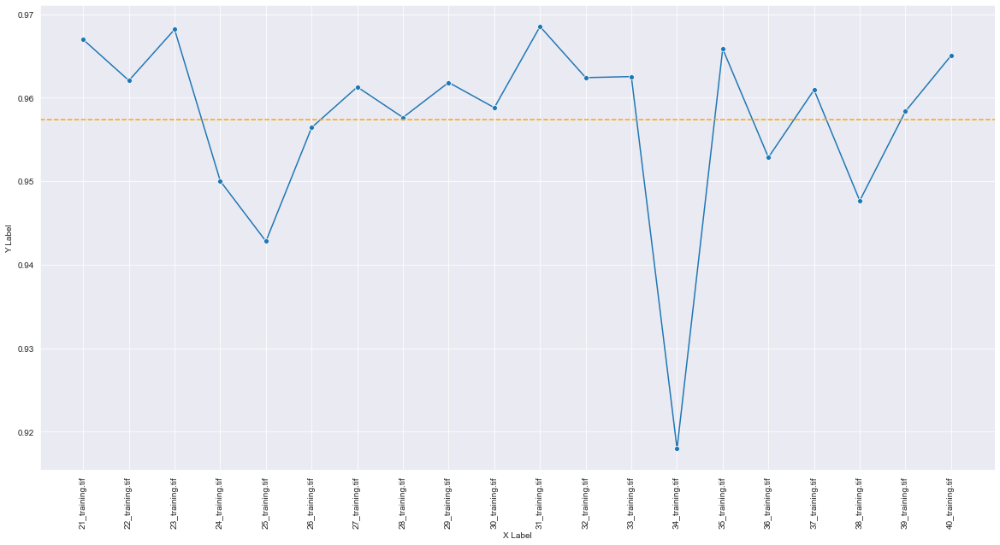

In [104]:
plt.figure(figsize=(20, 10))
sns.set_style("darkgrid")
ax = sns.lineplot(data=score_df, x="Image", y="Accuracy", marker = "o")
ax.axhline(score_df["Accuracy"].mean(), color="orange", linestyle="--")
ax.set(xlabel="X Label", ylabel = "Y Label")
plt.setp(ax.get_xticklabels(), rotation=90)


# The Test Images

In [105]:
# Next time change th path format
test_path = "D:\\Data sets\\DRIVE\\test"
test_ids = next(os.walk(test_path + "\\images"))[2]
test_gt_ids = next(os.walk(test_path + "\\1st_manual"))[2]

In [106]:
test_ids, test_gt_ids

(['01_test.tif',
  '02_test.tif',
  '03_test.tif',
  '04_test.tif',
  '05_test.tif',
  '06_test.tif',
  '07_test.tif',
  '08_test.tif',
  '09_test.tif',
  '10_test.tif',
  '11_test.tif',
  '12_test.tif',
  '13_test.tif',
  '14_test.tif',
  '15_test.tif',
  '16_test.tif',
  '17_test.tif',
  '18_test.tif',
  '19_test.tif',
  '20_test.tif'],
 ['01_manual1.gif',
  '02_manual1.gif',
  '03_manual1.gif',
  '04_manual1.gif',
  '05_manual1.gif',
  '06_manual1.gif',
  '07_manual1.gif',
  '08_manual1.gif',
  '09_manual1.gif',
  '10_manual1.gif',
  '11_manual1.gif',
  '12_manual1.gif',
  '13_manual1.gif',
  '14_manual1.gif',
  '15_manual1.gif',
  '16_manual1.gif',
  '17_manual1.gif',
  '18_manual1.gif',
  '19_manual1.gif',
  '20_manual1.gif'])

In [107]:
f1_set = []
score_set = []

  0%|                                                                                                                                                         | 0/20 [00:00<?, ?it/s]

D:\Data sets\DRIVE\test\images\01_test.tif
D:\Data sets\DRIVE\test\1st_manual\01_manual1.gif
Accuracy =  0.9621499575706146
0.9608505037483408


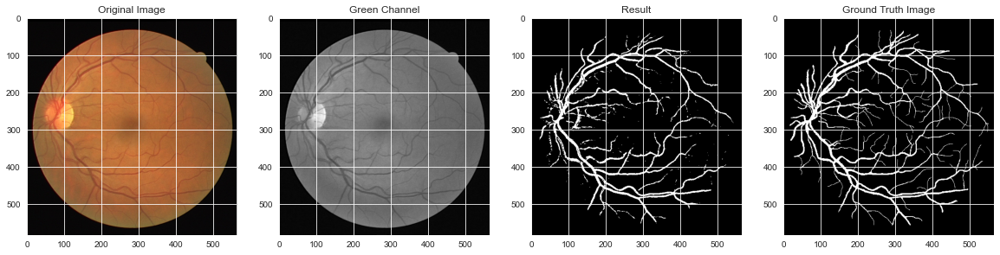

  5%|███████▎                                                                                                                                         | 1/20 [00:12<04:03, 12.81s/it]

D:\Data sets\DRIVE\test\images\02_test.tif
D:\Data sets\DRIVE\test\1st_manual\02_manual1.gif
Accuracy =  0.964807855497636
0.9633569764572875


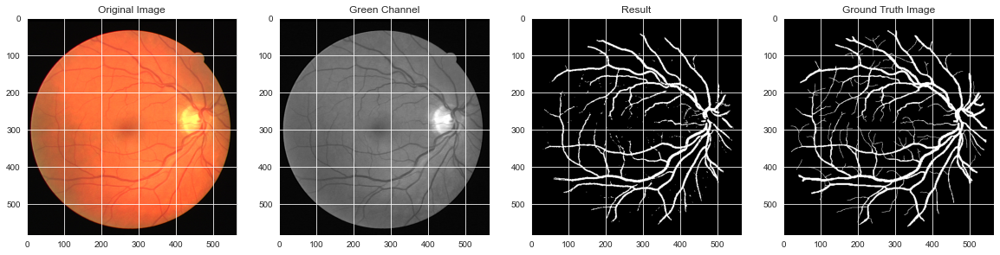

 10%|██████████████▌                                                                                                                                  | 2/20 [00:25<03:48, 12.69s/it]

D:\Data sets\DRIVE\test\images\03_test.tif
D:\Data sets\DRIVE\test\1st_manual\03_manual1.gif
Accuracy =  0.9493847739119893
0.9442304230360659


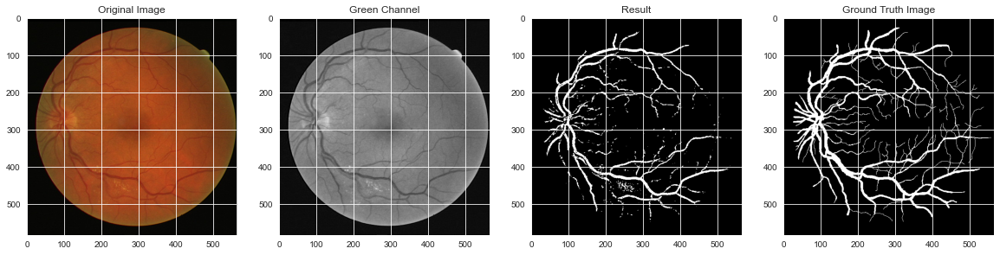

 15%|█████████████████████▊                                                                                                                           | 3/20 [00:37<03:34, 12.63s/it]

D:\Data sets\DRIVE\test\images\04_test.tif
D:\Data sets\DRIVE\test\1st_manual\04_manual1.gif
Accuracy =  0.9642380894653897
0.962406144190885


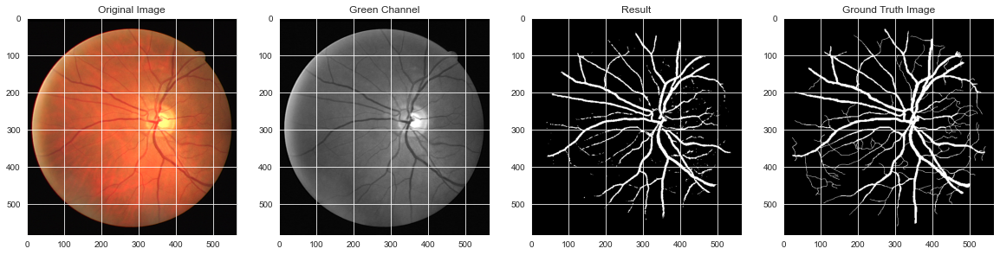

 20%|█████████████████████████████                                                                                                                    | 4/20 [00:50<03:21, 12.57s/it]

D:\Data sets\DRIVE\test\images\05_test.tif
D:\Data sets\DRIVE\test\1st_manual\05_manual1.gif
Accuracy =  0.9575130318826525
0.9534640977454524


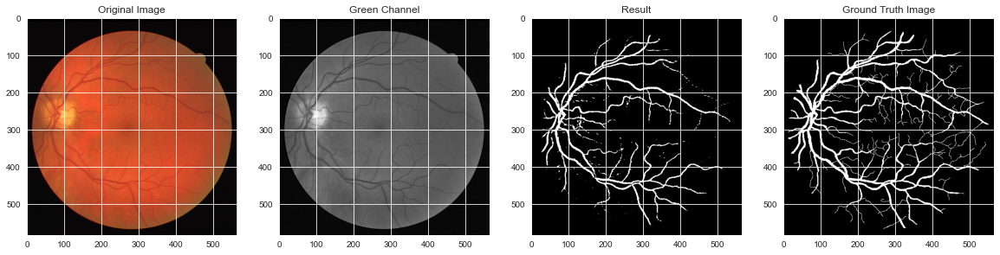

 25%|████████████████████████████████████▎                                                                                                            | 5/20 [01:03<03:11, 12.78s/it]

D:\Data sets\DRIVE\test\images\06_test.tif
D:\Data sets\DRIVE\test\1st_manual\06_manual1.gif
Accuracy =  0.953251909322342
0.9482812427358902


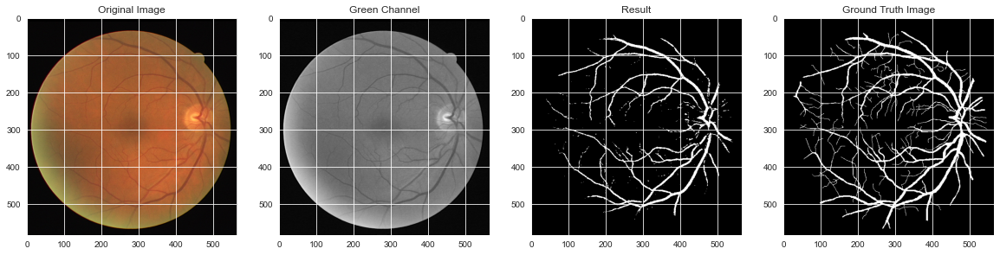

 30%|███████████████████████████████████████████▌                                                                                                     | 6/20 [01:16<02:59, 12.79s/it]

D:\Data sets\DRIVE\test\images\07_test.tif
D:\Data sets\DRIVE\test\1st_manual\07_manual1.gif
Accuracy =  0.9598133107043278
0.9571414484929017


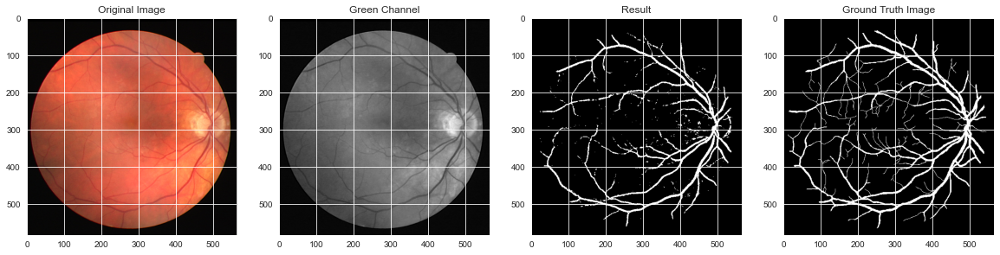

 35%|██████████████████████████████████████████████████▊                                                                                              | 7/20 [01:29<02:47, 12.88s/it]

D:\Data sets\DRIVE\test\images\08_test.tif
D:\Data sets\DRIVE\test\1st_manual\08_manual1.gif
Accuracy =  0.9520851012243908
0.9477493269911689


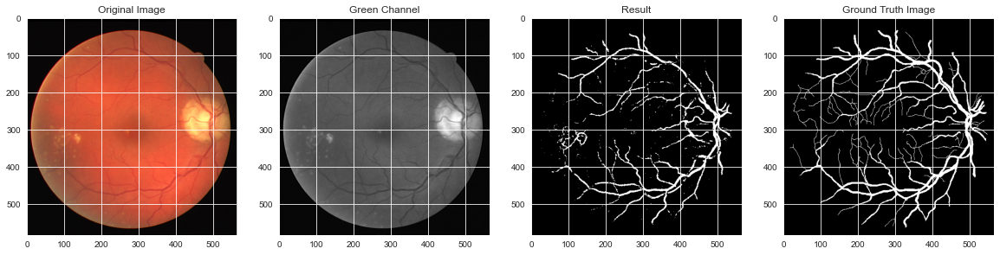

 40%|██████████████████████████████████████████████████████████                                                                                       | 8/20 [01:42<02:36, 13.01s/it]

D:\Data sets\DRIVE\test\images\09_test.tif
D:\Data sets\DRIVE\test\1st_manual\09_manual1.gif
Accuracy =  0.9544611468056734
0.9473513407582936


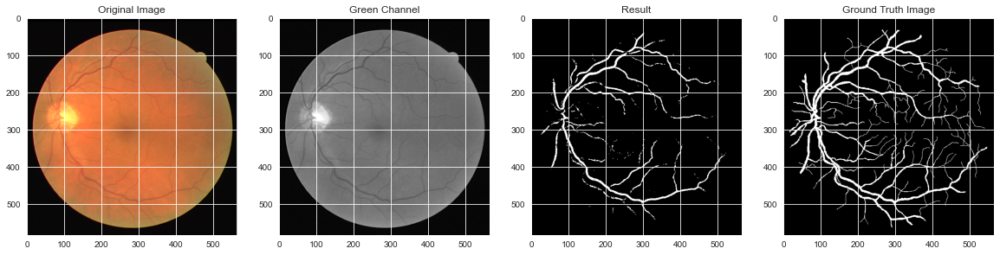

 45%|█████████████████████████████████████████████████████████████████▎                                                                               | 9/20 [01:55<02:21, 12.90s/it]

D:\Data sets\DRIVE\test\images\10_test.tif
D:\Data sets\DRIVE\test\1st_manual\10_manual1.gif
Accuracy =  0.9608801066795976
0.9584139199588334


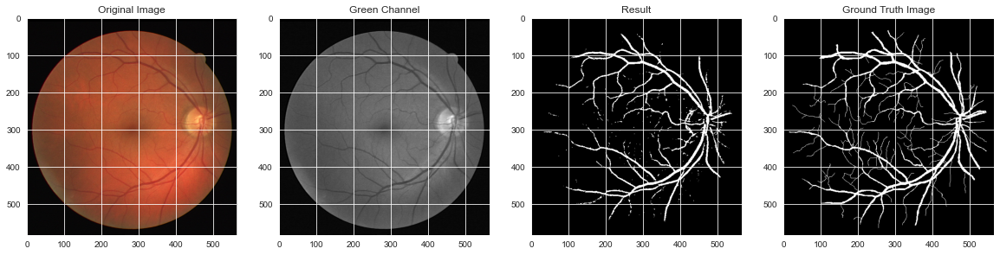

 50%|████████████████████████████████████████████████████████████████████████                                                                        | 10/20 [02:08<02:08, 12.89s/it]

D:\Data sets\DRIVE\test\images\11_test.tif
D:\Data sets\DRIVE\test\1st_manual\11_manual1.gif
Accuracy =  0.9616559582979756
0.9601799780727804


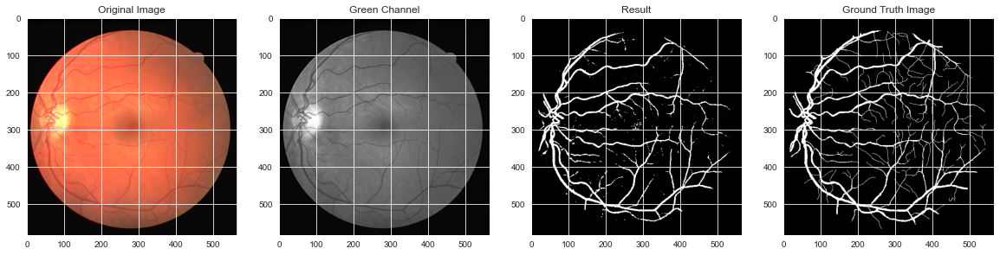

 55%|███████████████████████████████████████████████████████████████████████████████▏                                                                | 11/20 [02:21<01:55, 12.88s/it]

D:\Data sets\DRIVE\test\images\12_test.tif
D:\Data sets\DRIVE\test\1st_manual\12_manual1.gif
Accuracy =  0.9610346708691963
0.9588737523097233


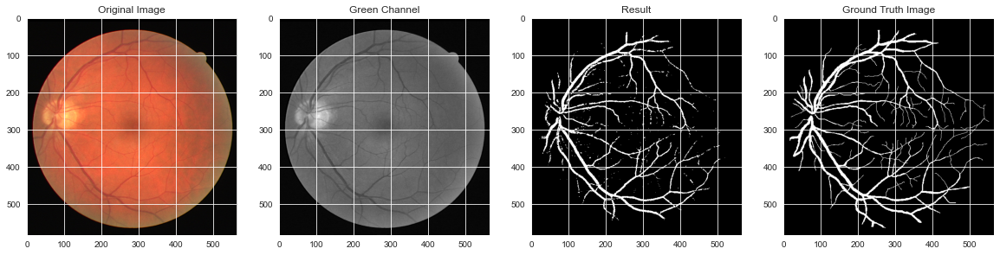

 60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                         | 12/20 [02:34<01:43, 12.92s/it]

D:\Data sets\DRIVE\test\images\13_test.tif
D:\Data sets\DRIVE\test\1st_manual\13_manual1.gif
Accuracy =  0.9537368165838284
0.9489481342827136


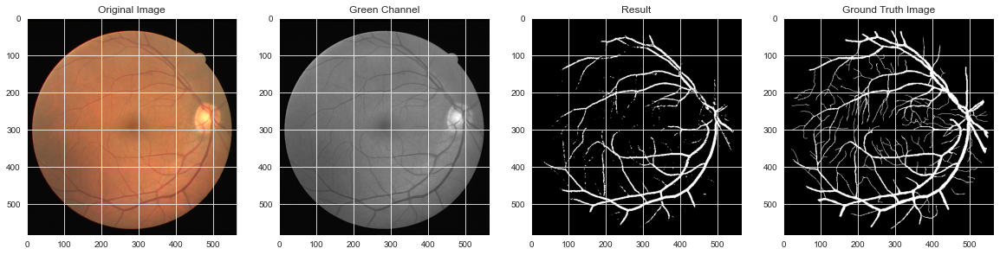

 65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 13/20 [02:46<01:29, 12.84s/it]

D:\Data sets\DRIVE\test\images\14_test.tif
D:\Data sets\DRIVE\test\1st_manual\14_manual1.gif
Accuracy =  0.9623408898048248
0.9616596389996483


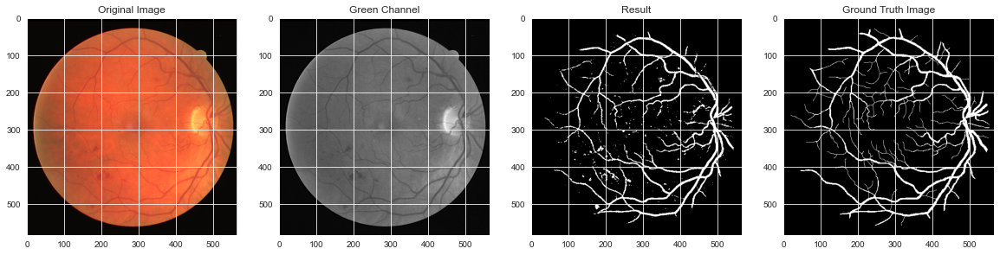

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 14/20 [02:59<01:16, 12.72s/it]

D:\Data sets\DRIVE\test\images\15_test.tif
D:\Data sets\DRIVE\test\1st_manual\15_manual1.gif
Accuracy =  0.9543853800460662
0.9558260401070962


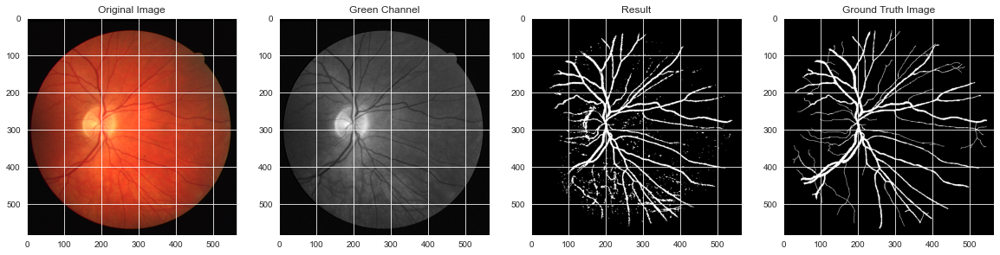

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 15/20 [03:11<01:03, 12.72s/it]

D:\Data sets\DRIVE\test\images\16_test.tif
D:\Data sets\DRIVE\test\1st_manual\16_manual1.gif
Accuracy =  0.9605921929930901
0.9576106967311876


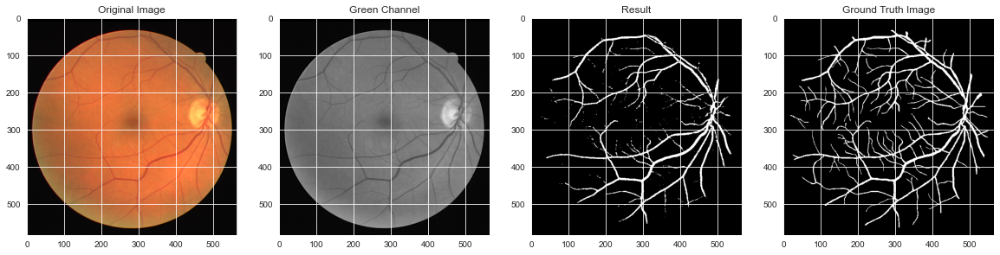

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 16/20 [03:24<00:50, 12.66s/it]

D:\Data sets\DRIVE\test\images\17_test.tif
D:\Data sets\DRIVE\test\1st_manual\17_manual1.gif
Accuracy =  0.9520214571463208
0.9456877844331579


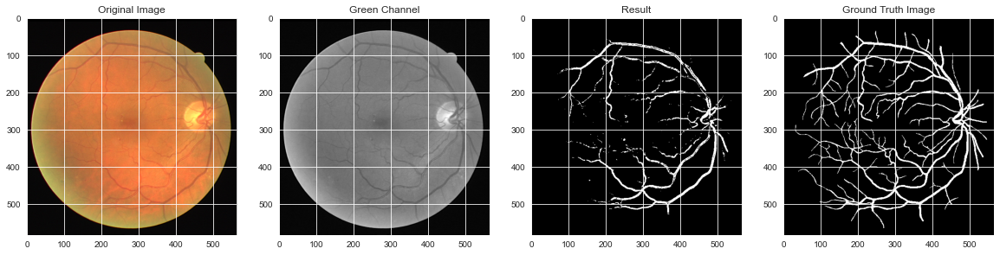

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 17/20 [03:37<00:38, 12.70s/it]

D:\Data sets\DRIVE\test\images\18_test.tif
D:\Data sets\DRIVE\test\1st_manual\18_manual1.gif
Accuracy =  0.9599436295308522
0.9575866114858992


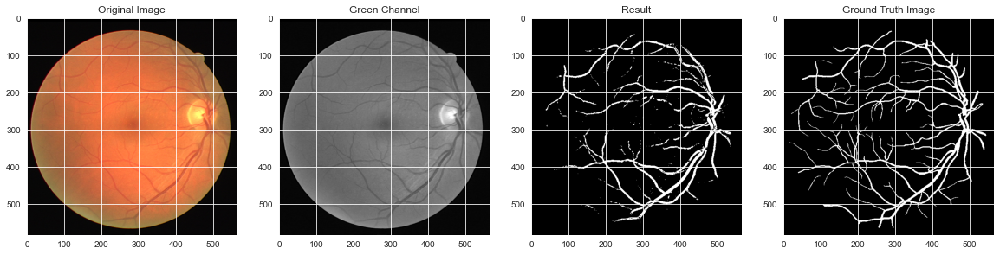

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 18/20 [03:50<00:25, 12.96s/it]

D:\Data sets\DRIVE\test\images\19_test.tif
D:\Data sets\DRIVE\test\1st_manual\19_manual1.gif
Accuracy =  0.9727027518487089
0.9722877200007648


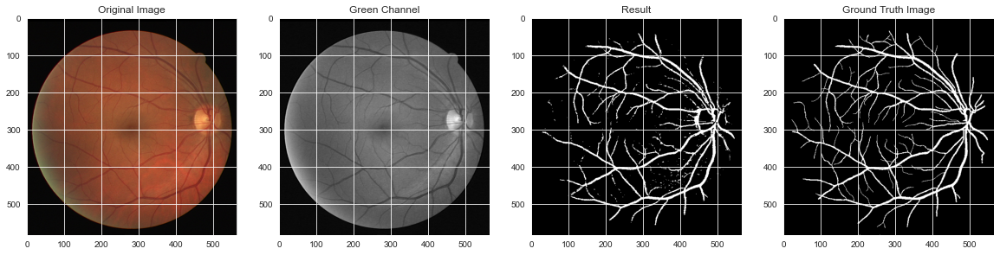

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 19/20 [04:03<00:13, 13.05s/it]

D:\Data sets\DRIVE\test\images\20_test.tif
D:\Data sets\DRIVE\test\1st_manual\20_manual1.gif
Accuracy =  0.9651381985695235
0.9635834939072647


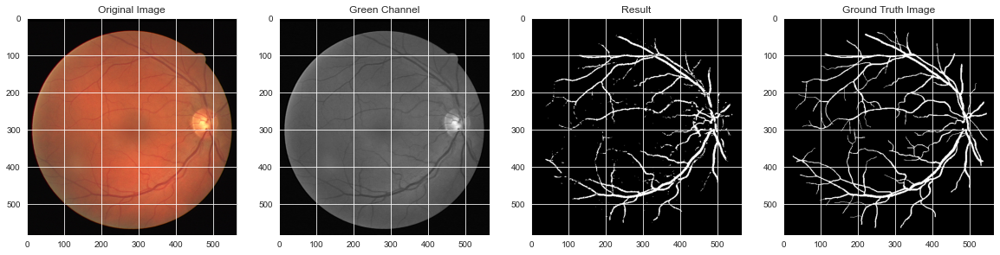

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:16<00:00, 12.84s/it]


In [108]:
for _id in tqdm(range(len(test_ids))):
    
    image = test_ids[_id]
    gt_image = test_gt_ids[_id]
    

    tdf = pd.DataFrame()  #Temporary data frame for each Image

    path = test_path + "\\images\\" + image
    print(path)

    img = cv2.imread(path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img[:,:,1]

#     plt.imshow(img ,cmap = "gray")

    tdf,img2 = originalImg(img,tdf)
    tdf['Image_Name'] = image
    tdf = gaborFilter(img2,tdf)

    tdf = cannyEdge(tdf,img)

    tdf = the4edgeDetectors(tdf,img)

    tdf = gmv(tdf,img)

    gt_path = test_path + "\\1st_manual\\" + gt_image
    print(gt_path)
    tdf = gtImage(gt_path,tdf)
    
    x = tdf.drop(labels = ["Image_Name","Labels"], axis=1)
    select_X_test = selection.transform(x)
    y = tdf["Labels"]
    
    prediction_test = xg_cl_sel.predict(select_X_test)
    result = prediction_test.reshape((584, 565))
    
    
    gtImg = gtImageDis(gt_path)


    
    fig, axes = plt.subplots(1, 4, figsize=(20, 20))
    ax = axes.ravel()
    ax[0].set_title("Original Image")
    ax[0].imshow(img_rgb, cmap = 'gray')
    ax[1].set_title("Green Channel")
    ax[1].imshow(img, cmap = 'gray')
    ax[2].set_title("Result")
    ax[2].imshow(result, cmap = 'gray')
    ax[3].set_title("Ground Truth Image")
    ax[3].imshow(gtImg, cmap = 'gray')
    
    acc = metrics.accuracy_score(y, prediction_test)
    print ("Accuracy = ", acc)
    
    cm = confusion_matrix(y, prediction_test)
    sens, spe, acc = getMetrics(cm)
    
    print(f1_score(y, prediction_test, average = "weighted"))
    f1_set.append([test_ids[_id],f1_score(y, prediction_test, average = "weighted")])
    score_set.append([test_ids[_id], sens, spe, acc])
    
    filename = str(_id + 1) + ".png"
    #     cv2.imwrite(filename, result)
    
    plt.show()

# Test Results

In [109]:
score_df = pd.DataFrame(score_set, columns=["Image","Sensitivity", "Specificity", "Accuracy"])
score_df

,Image,Sensitivity,Specificity,Accuracy
0,01_test.tif,0.717697,0.986097,0.962150
1,02_test.tif,0.743948,0.990006,0.964808
2,03_test.tif,0.563463,0.992116,0.949385
3,04_test.tif,0.704421,0.990561,0.964238
4,05_test.tif,0.600996,0.994365,0.957513
5,06_test.tif,0.571148,0.994453,0.953252
6,07_test.tif,0.653025,0.990667,0.959813
7,08_test.tif,0.557540,0.989226,0.952085
8,09_test.tif,0.468756,0.997296,0.954461
9,10_test.tif,0.642031,0.989475,0.960880


In [110]:
score_df["Sensitivity"].mean(), score_df["Specificity"].mean() ,score_df["Accuracy"].mean()

(0.6453866147858763, 0.9893735876160775, 0.9591068614377498)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

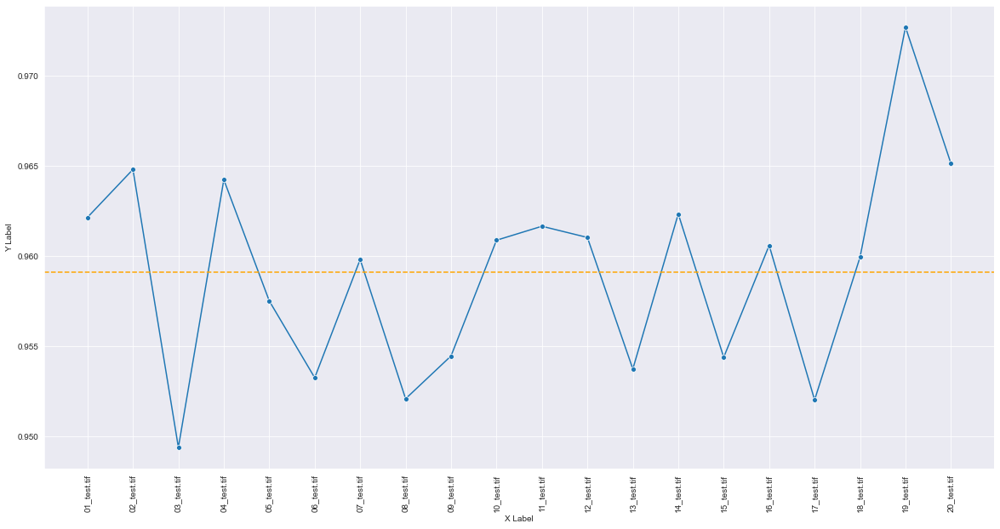

In [111]:
plt.figure(figsize=(20, 10))
sns.set_style("darkgrid")
ax = sns.lineplot(data=score_df, x="Image", y="Accuracy", marker = "o")
ax.axhline(score_df["Accuracy"].mean(), color="orange", linestyle="--")
ax.set(xlabel="X Label", ylabel = "Y Label")
plt.setp(ax.get_xticklabels(), rotation=90)